In [2]:
import pandas as pd
import folium
from folium.plugins import HeatMap
from pyproj import Proj, transform
import numpy as np

df = pd.read_excel("pollution_no_gas_cleaned.xlsx")

# Get min/max pollution values to create a dynamic color scale
min_pollution = df['QUANTITY RELEASED (kg)'].min()
max_pollution = df['QUANTITY RELEASED (kg)'].max()

# Calculate percentiles for the QUANTITY RELEASED (kg)
percentiles = np.percentile(df['QUANTITY RELEASED (kg)'], [0, 20, 40, 60, 80, 100])

# Create a new column to assign percentile categories to each point
def assign_color(value):
    if value <= percentiles[1]:
        return 'Very Low', '#98fb98'   # Light Green
    elif value <= percentiles[2]:
        return 'Low', '#00ff00'        # Green
    elif value <= percentiles[3]:
        return 'Medium', '#ffff00'     # Yellow
    elif value <= percentiles[4]:
        return 'High', '#ffa500'       # Orange
    else:
        return 'Very High', '#ff0000'  # Red

df[['Pollution Category', 'Color']] = df['QUANTITY RELEASED (kg)'].apply(assign_color).apply(pd.Series)
# Create a Folium map centered around the UK
m = folium.Map(location=[54.5, -2], zoom_start=6)

# Add a HeatMap of pollution intensity with dynamic color scaling
#heat_data = list(zip(df['Latitude'], df['Longitude'], df['QUANTITY RELEASED (kg)']))
# Add circle markers for each location
for idx, row in df.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,  # Adjust size of the markers
        color=row['Color'],  # Color based on percentile
        fill=True,
        fill_color=row['Color'],
        fill_opacity=0.6
    ).add_to(m)

# Dynamic legend based on percentiles
legend_html = f'''
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 250px;
    height: 180px;
    background-color: white;
    z-index:9999;
    font-size:14px;
    border:2px solid grey;
    padding: 15px;
    line-height: 22px;
">
<b>Pollution Intensity (Percentiles)</b><br><br>
<div style="background:#98fb98;width:20px;height:20px;float:left;margin-right:5px;"></div> Very Low: <= {percentiles[1]:.0f} kg<br>
<div style="background:#00ff00;width:20px;height:20px;float:left;margin-right:5px;"></div> Low: <= {percentiles[2]:.0f} kg<br>
<div style="background:#ffff00;width:20px;height:20px;float:left;margin-right:5px;"></div> Medium: <= {percentiles[3]:.0f} kg<br>
<div style="background:#ffa500;width:20px;height:20px;float:left;margin-right:5px;"></div> High: <= {percentiles[4]:.0f} kg<br>
<div style="background:#ff0000;width:20px;height:20px;float:left;margin-right:5px;"></div> Very High: > {percentiles[4]:.0f} kg<br>
</div>
'''

# ✅ Attach the larger legend to the map
m.get_root().html.add_child(folium.Element(legend_html))

# Save the map to an HTML file
m.save('pollution_map_with_expanded_legend.html')

m.get_root().html.add_child(folium.Element(legend_html))

# Save the map to an HTML file
m.save('pollution_map_with_full_legend.html')

# If running in Jupyter Notebook, display the map
m


In [6]:
import pandas as pd
import folium
from folium import plugins

# Define the categories and colors
categories = [
    (0, 1, 'lightgreen'),
    (1, 10, 'green'),
    (10, 100, 'yellow'),
    (100, 1000, 'orange'),
    (1000, 10000, 'red'),
    (10000, 100000, 'darkred'),
    (100000, float('inf'), 'purple')
]

# Function to categorize the quantity released and return a color
def get_color(quantity):
    for lower, upper, color in categories:
        if lower <= quantity < upper:
            return color
    return 'gray'  # In case no category is found

# Initialize the map (centered around a point in the UK)
m = folium.Map(location=[54.0, -2.0], zoom_start=6)

# Add markers for each point
for index, row in df.iterrows():
    # Get the coordinates and quantity released
    lat = row['Latitude']  # Replace with the correct column name for latitude
    lon = row['Longitude']  # Replace with the correct column name for longitude
    quantity = row['QUANTITY RELEASED (kg)']
    
    # Get the color based on the quantity
    color = get_color(quantity)
    
    # Add a marker to the map
    folium.CircleMarker(
        location=(lat, lon),
        radius=6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6
    ).add_to(m)

# Add a legend to the map
legend_html = """
    <div style="position: fixed; 
                bottom: 10px; left: 10px; width: 200px; height: 250px; 
                border:2px solid grey; z-index:9999; font-size:14px; 
                background-color: white; padding: 10px;">
    <b>Quantity Released (kg) Categories</b><br>
    <i style="background:lightgreen; width: 20px; height: 20px; display: inline-block;"></i> 0-1 kg<br>
    <i style="background:green; width: 20px; height: 20px; display: inline-block;"></i> 1-10 kg<br>
    <i style="background:yellow; width: 20px; height: 20px; display: inline-block;"></i> 10-100 kg<br>
    <i style="background:orange; width: 20px; height: 20px; display: inline-block;"></i> 100-1000 kg<br>
    <i style="background:red; width: 20px; height: 20px; display: inline-block;"></i> 1000-10,000 kg<br>
    <i style="background:darkred; width: 20px; height: 20px; display: inline-block;"></i> 10,000-100,000 kg<br>
    <i style="background:purple; width: 20px; height: 20px; display: inline-block;"></i> 100,000 kg+<br>
    </div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Show the map
m.save("pollution_map.html")
m

In [7]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Define the categories and corresponding colors (though Folium doesn't directly support category colors in HeatMap)
categories = [
    (0, 1, 'green'),
    (1, 10, 'lightgreen'),
    (10, 100, 'yellow'),
    (100, 1000, 'orange'),
    (1000, 10000, 'red'),
    (10000, 100000, 'purple'),
    (100000, float('inf'), 'darkred')
]

# Function to categorize the quantity released and return a corresponding weight for the heatmap
def get_weight(quantity):
    for lower, upper, _ in categories:
        if lower <= quantity < upper:
            return quantity  # We will use the quantity itself as the weight
    return 0  # In case something unexpected happens, we return 0 for weight

# Initialize the map (centered around a point in the UK)
m = folium.Map(location=[54.0, -2.0], zoom_start=6)

# Create a list to hold the coordinates and weights for the heatmap
heat_data = []

# Iterate over the dataset and prepare the heatmap data
for index, row in df.iterrows():
    lat = row['Latitude']  # Replace with the correct column name for latitude
    lon = row['Longitude']  # Replace with the correct column name for longitude
    quantity = row['QUANTITY RELEASED (kg)']
    
    # Get the weight (which will be the quantity released)
    weight = get_weight(quantity)
    
    # Add to heat_data as [latitude, longitude, weight]
    heat_data.append([lat, lon, weight])

# Add the heatmap layer to the map
HeatMap(heat_data).add_to(m)
#HeatMap(heat_data, gradient={0.0: 'green', 0.1: 'yellow', 0.5: 'orange', 0.6: 'darkred', 1: 'darkred'}).add_to(m)

# Show the map
m.save("heatmap_pollution.html")
m

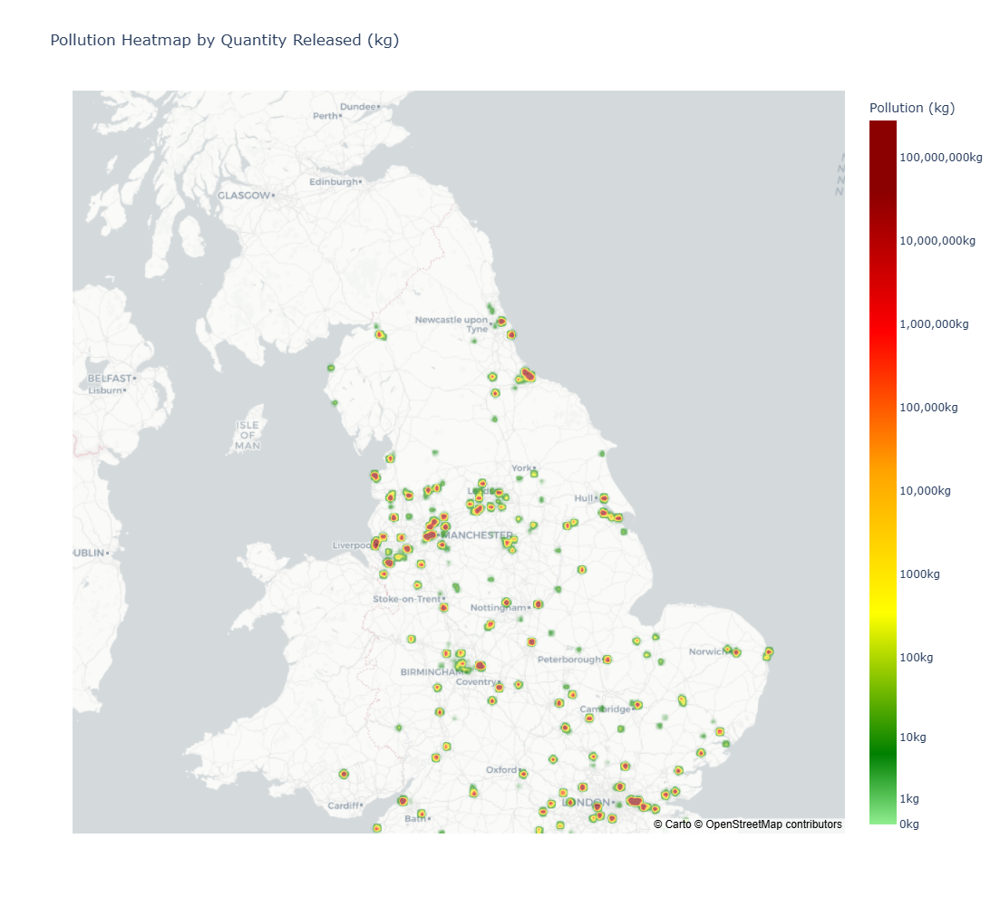

In [10]:
import pandas as pd
import plotly.express as px
df = pd.read_excel("pollution_no_gas_cleaned.xlsx")
df['Exponential Quantity'] = np.log1p(df['QUANTITY RELEASED (kg)'])
# Define the categories for the colors
bins = [0, 1, 10, 100, 1000, 10000, 100000, float('inf')]  # Defining the bins for the pollution categories
labels = ['0-1kg', '1-10kg', '10-100kg', '100-1000kg', '1000-10000kg', '10000-100000kg', '100000kg+']

# Categorize the `QUANTITY RELEASED (kg)` into the defined bins
df['Pollution Category'] = pd.cut(df['QUANTITY RELEASED (kg)'], bins=bins, labels=labels, right=False)

# Define the custom color scale. The color for values above 100,000 kg will be the same as for 100,000 kg+.
color_scale = [
    [0, "lightgreen"],       # 0-1 kg
    [0.1, "green"],      # 1-10 kg
    [0.3, "yellow"], # 10-100 kg
    [0.5, "orange"],     # 100-1000 kg
    [0.7, "red"],        # 1000-10000 kg
    [0.9, "darkred"],    # 10000-100000 kg
    [1, "darkred"]       # 100000+ kg (same as the maximum value)
]
# Plot the heatmap using Plotly
fig = px.density_mapbox(
    df, 
    lat='Latitude', 
    lon='Longitude', 
    z='Exponential Quantity',  # Quantity released will define the intensity
    color_continuous_scale=color_scale,  # Color scale from yellow to red
    title="Pollution Heatmap by Quantity Released (kg)",
    mapbox_style="carto-positron",  # Use 'open-street-map' for free style or 'carto-positron' for a lighter map
    center={"lat": 54.0, "lon": -2.0},  # Center the map to UK
    zoom=6,
    opacity=0.6,
    radius=5,
    hover_data={'Latitude': False, 'Longitude': False, 'Exponential Quantity': False, 'Pollution Category': False, 'QUANTITY RELEASED (kg)': True}
)

# Define the legend categories that will display original pollution categories
legend_ticks = [0, 1, 10, 100, 1000, 10000, 100000,1000000, 10000000, 100000000]
legend_labels = ['0kg', '1kg', '10kg', '100kg', '1000kg', '10,000kg', '100,000kg','1,000,000kg','10,000,000kg', '100,000,000kg']
legend_ticks = np.log1p(legend_ticks)
# Manually update the legend to show the original categories based on pollution ranges
fig.update_layout(
    coloraxis_colorbar=dict(
        tickvals=legend_ticks,  # The ticks on the legend
        ticktext=legend_labels,  # The labels for each range
        title="Pollution (kg)",  # Legend title
    )
)
# Show the plot
fig.layout.height=1000
fig.show()



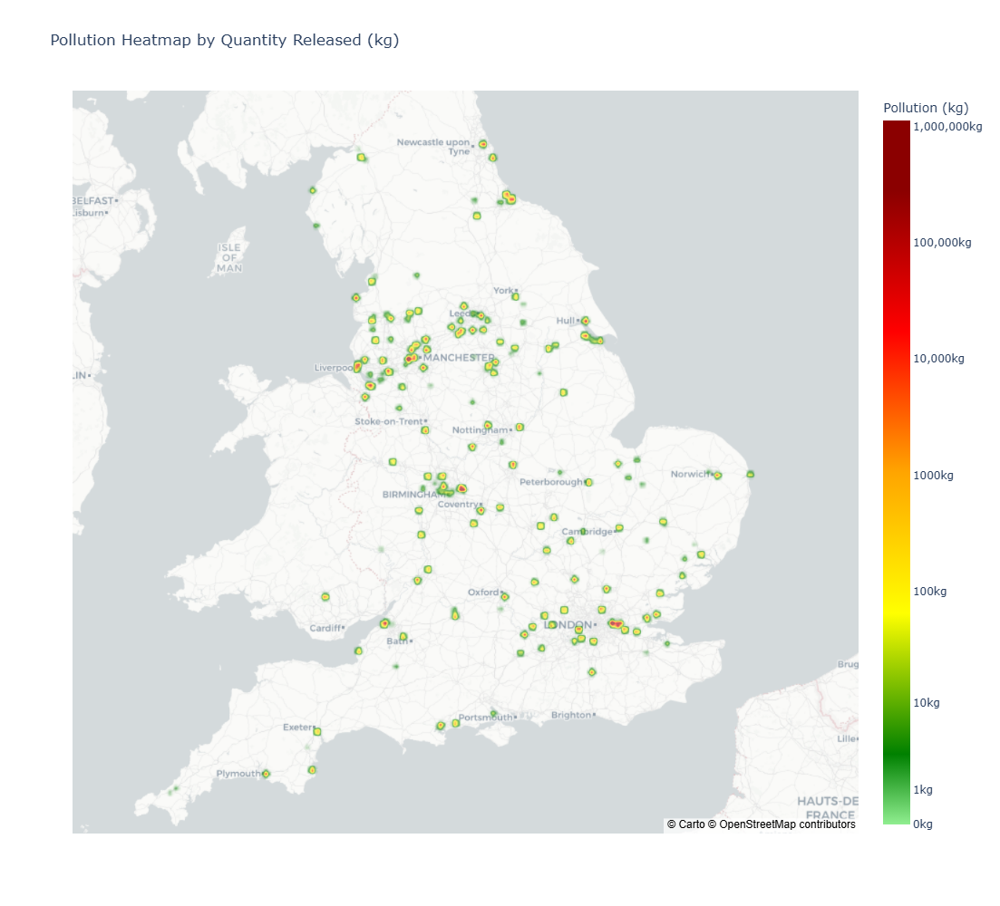

In [26]:
df = pd.read_excel("pollution_no_gas_cleaned.xlsx")
substances_to_keep = ['Nickel', 'Copper', 'Zinc', 'Phosphorus - as total P', 'Arsenic']
df = df[df['SUBSTANCE NAME'].isin(substances_to_keep)]
df['Exponential Quantity'] = np.log1p(df['QUANTITY RELEASED (kg)'])
# Define the categories for the colors
bins = [0, 1, 10, 100, 1000, 10000, 100000, float('inf')]  # Defining the bins for the pollution categories
labels = ['0-1kg', '1-10kg', '10-100kg', '100-1000kg', '1000-10000kg', '10000-100000kg', '100000kg+']

# Categorize the `QUANTITY RELEASED (kg)` into the defined bins
df['Pollution Category'] = pd.cut(df['QUANTITY RELEASED (kg)'], bins=bins, labels=labels, right=False)

# Define the custom color scale. The color for values above 100,000 kg will be the same as for 100,000 kg+.
color_scale = [
    [0, "lightgreen"],       # 0-1 kg
    [0.1, "green"],      # 1-10 kg
    [0.3, "yellow"], # 10-100 kg
    [0.5, "orange"],     # 100-1000 kg
    [0.7, "red"],        # 1000-10000 kg
    [0.9, "darkred"],    # 10000-100000 kg
    [1, "darkred"]       # 100000+ kg (same as the maximum value)
]
# Plot the heatmap using Plotly
fig = px.density_mapbox(
    df, 
    lat='Latitude', 
    lon='Longitude', 
    z='Exponential Quantity',  # Quantity released will define the intensity
    color_continuous_scale=color_scale,  # Color scale from yellow to red
    title="Pollution Heatmap by Quantity Released (kg)",
    mapbox_style="carto-positron",  # Use 'open-street-map' for free style or 'carto-positron' for a lighter map
    center={"lat": 54.0, "lon": -2.0},  # Center the map to UK
    zoom=6,
    opacity=0.6,
    radius=5,
    hover_data={'Latitude': False, 'Longitude': False, 'Exponential Quantity': False, 'Pollution Category': False, 'QUANTITY RELEASED (kg)': True, 'SUBSTANCE NAME' : True}
)

# Define the legend categories that will display original pollution categories
legend_ticks = [0, 1, 10, 100, 1000, 10000, 100000,1000000, 10000000, 100000000]
legend_labels = ['0kg', '1kg', '10kg', '100kg', '1000kg', '10,000kg', '100,000kg','1,000,000kg','10,000,000kg', '100,000,000kg']
legend_ticks = np.log1p(legend_ticks)
# Manually update the legend to show the original categories based on pollution ranges
fig.update_layout(
    coloraxis_colorbar=dict(
        tickvals=legend_ticks,  # The ticks on the legend
        ticktext=legend_labels,  # The labels for each range
        title="Pollution (kg)",  # Legend title
    )
)
# Show the plot
fig.layout.height=1000
fig.show()